### _NOTE:_ You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All". 


___
# Ioannou_Georgios


## Copyright © 2022 by Georgios Ioannou


___
<h1 align="center"> Voice Emotion Recognition of Audio </h1>
<h2 align="center"> Speech Emotion Recognition </h2>

In this notebook, we will be classifying emotion based on audio. The datasets we will be using are called:
1. [`RAVDESS Emotional speech audio`](https://www.kaggle.com/datasets/uwrfkaggler/ravdess-emotional-speech-audio/versions/1)
2. [`Crowd Sourced Emotional Multimodal Actors Dataset (CREMA-D)`](https://www.kaggle.com/datasets/ejlok1/cremad/versions/1)
3. [`Surrey Audio-Visual Expressed Emotion (SAVEE)`](https://www.kaggle.com/datasets/ejlok1/surrey-audiovisual-expressed-emotion-savee/versions/1)
4. [`Toronto emotional speech set (TESS)`](https://www.kaggle.com/datasets/ejlok1/toronto-emotional-speech-set-tess/versions/1)


___
<h2 align="center"> Remember our main steps motto "ISBE". </h2>

<h3 align="center"> Main Steps when building a Machine Learning Model. </h3>

1. <b>I</b> - Inspect and explore data.
2. <b>S</b> - Select and engineer features.
3. <b>B</b> - Build and train model.
4. <b>E</b> - Evaluate model.


___
<h2 align="center"> Libraries </h2>


In [1]:
# import libraries.

# Use inline so our visualizations display in notebook.


%matplotlib inline


import IPython
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')


from keras.utils import np_utils
from keras.utils.np_utils import to_categorical
from plotly.subplots import make_subplots
from pydub import AudioSegment
from pydub.silence import split_on_silence
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, multilabel_confusion_matrix, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.models import load_model
from tqdm.auto import tqdm


___
## #1 Inspect and Explore Data


## 1.1 List All Files Under The Input Directory To See The File Paths


In [2]:
files_list = []
files_count = 0

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        files_list.append(os.path.join(dirname, filename))
        files_count += 1

# Remove the file /kaggle/input/videodemographics/VideoDemographics.csv as it is not an audio file.
files_list.remove('/kaggle/input/videodemographics/VideoDemographics.csv')

print('\nLength of files_list=', len(files_list))
print('files_list[0]=', files_list[0])
print('files_list[12161]=', files_list[12161])
print('files_count(audio files)=', files_count - 1)



Length of files_list= 12170
files_list[0]= /kaggle/input/audiofeatures/audio_features.csv
files_list[12161]= /kaggle/input/ravdessemotionalspeechaudio/Actor_07/03-01-06-02-02-02-07.wav
files_count(audio files)= 12170


## 1.2 Import Datasets Paths

In [3]:
RAVDESS_PATH = '../input/ravdessemotionalspeechaudio'
CREMAD_PATH  = '../input/cremad/AudioWAV/'
SAVEE_PATH   = '../input/surrey-audiovisual-expressed-emotion-savee/ALL/'
TESS_PATH    = '../input/torontoemotionalspeechsettess'


## 1.3 Prepare the data of the RAVDESS Dataset


In [4]:
# Accessing inner files.
# List comprehension gets rid of hidden files.
ravdess_dir_list = [x for x in os.listdir(RAVDESS_PATH) if not x.startswith('.')]
print('Ravdess:\n', sorted(ravdess_dir_list))


Ravdess:
 ['Actor_01', 'Actor_02', 'Actor_03', 'Actor_04', 'Actor_05', 'Actor_06', 'Actor_07', 'Actor_08', 'Actor_09', 'Actor_10', 'Actor_11', 'Actor_12', 'Actor_13', 'Actor_14', 'Actor_15', 'Actor_16', 'Actor_17', 'Actor_18', 'Actor_19', 'Actor_20', 'Actor_21', 'Actor_22', 'Actor_23', 'Actor_24']


In [5]:
# Create df columns.
emotion = []
gender = []
location = []

# Iterate over inner folders.
for actor_file in ravdess_dir_list:
    actor_wavs = [x for x in os.listdir(RAVDESS_PATH + '/' + actor_file) if not x.startswith('.')]
    # Iterate over .wav files.
    for wav in actor_wavs:
        partition = wav.split('-')
        emotion_num = int(partition[2])
        
        emotion.append(emotion_num)
        actor_num = int(partition[6].split('.')[0])
        
        if (actor_num%2 == 0): gender.append('female')
        else: gender.append('male')
        
        location.append(RAVDESS_PATH + '/' + actor_file + '/' + wav)

# Initialize dataframe.
ravdess_df = pd.DataFrame({'gender': gender, 'emotion': emotion, 'location': location },
                          columns=['gender','emotion', 'location'])

# Swap numerical value to label.
ravdess_df = ravdess_df.replace({"emotion": {1:'neutral', 2:'calm', 3:'happy', 4:'sad',
                                5:'angry', 6:'fear', 7:'disgust', 8:'surprise'}})

print('ravdess_df.shape=', ravdess_df.shape, '\n')
print('Unique emotions = ', ravdess_df['emotion'].unique(), '\n')
print('# of Unique emotions = ', len(ravdess_df['emotion'].unique()), '\n')
print(ravdess_df.emotion.value_counts(), '\n')
ravdess_df


ravdess_df.shape= (1440, 3) 

Unique emotions =  ['surprise' 'neutral' 'disgust' 'fear' 'sad' 'calm' 'happy' 'angry'] 

# of Unique emotions =  8 

surprise    192
disgust     192
fear        192
sad         192
calm        192
happy       192
angry       192
neutral      96
Name: emotion, dtype: int64 



,gender,emotion,location
0,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
1,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
2,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
3,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
4,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
...,...,...,...
1435,male,fear,../input/ravdessemotionalspeechaudio/Actor_07/...
1436,male,angry,../input/ravdessemotionalspeechaudio/Actor_07/...
1437,male,sad,../input/ravdessemotionalspeechaudio/Actor_07/...
1438,male,disgust,../input/ravdessemotionalspeechaudio/Actor_07/...


## 1.4 Prepare the data of the CREMA-D Dataset


In [6]:
# Creating dictionary from CREMA github documentation on actors' gender.
Crema_genders = pd.read_csv('../input/videodemographics/VideoDemographics.csv')
select_cond = ['ActorID', 'Sex']

# Looks like this: {1001: 'female'}
extraction = Crema_genders[select_cond]
extraction_dict = dict(extraction.values)


# Processing CREMA Dataset.

emotion = []
intensity = []
gender = []
location = []

wavs = [x for x in os.listdir(CREMAD_PATH) if not x.startswith('.')]

for wav in wavs:
    partition = wav.split('_')
    emotion_ = partition[2]
    intensity_ = partition[3].split('.')[0]
    actor_ID = int(partition[0])
    
    # looks up the dictionary made in prev cell
    if actor_ID in extraction_dict: gender.append(extraction_dict.get(actor_ID))
    
    intensity.append(intensity_)
    emotion.append(emotion_) 
    location.append(CREMAD_PATH + '/' + wav)

crema_df = pd.DataFrame({'gender': gender, 'emotion': emotion, 'location': location}, 
                        columns=['gender','emotion', 'location'])

crema_df = crema_df.replace({'emotion': {'ANG':'angry','DIS': 'disgust',
                                        'FEA': 'fear','HAP': 'happy',
                                        'NEU': 'neutral','SAD': 'sad'}})

crema_df = crema_df.replace({'intensity': {'LO': 'low','MD': 'medium',
                                            'HI': 'high','XX': 'unspecified'}})                           

print('crema_df.shape=', crema_df.shape, '\n')
print('Unique emotions = ', crema_df['emotion'].unique(), '\n')
print('# of Unique emotions = ', len(crema_df['emotion'].unique()), '\n')
print(crema_df.emotion.value_counts(), '\n')
crema_df


crema_df.shape= (7442, 3) 

Unique emotions =  ['disgust' 'happy' 'sad' 'neutral' 'fear' 'angry'] 

# of Unique emotions =  6 

disgust    1271
happy      1271
sad        1271
fear       1271
angry      1271
neutral    1087
Name: emotion, dtype: int64 



,gender,emotion,location
0,Female,disgust,../input/cremad/AudioWAV//1028_TSI_DIS_XX.wav
1,Female,happy,../input/cremad/AudioWAV//1075_IEO_HAP_LO.wav
2,Female,happy,../input/cremad/AudioWAV//1084_ITS_HAP_XX.wav
3,Male,disgust,../input/cremad/AudioWAV//1067_IWW_DIS_XX.wav
4,Male,disgust,../input/cremad/AudioWAV//1066_TIE_DIS_XX.wav
...,...,...,...
7437,Female,angry,../input/cremad/AudioWAV//1060_IEO_ANG_MD.wav
7438,Male,angry,../input/cremad/AudioWAV//1088_IWL_ANG_XX.wav
7439,Male,angry,../input/cremad/AudioWAV//1050_IOM_ANG_XX.wav
7440,Male,sad,../input/cremad/AudioWAV//1044_IWL_SAD_XX.wav


## 1.5 Prepare the data of the SAVEE Dataset


In [7]:
location = []
gender = []
emotion = []

wavs = [x for x in os.listdir(SAVEE_PATH) if not x.startswith('.')]

for wav in wavs:
    partition = wav.split('_')
    emotion_ = partition[1].split('.')[0]
    emotion_ = ''.join(i for i in emotion_ if not i.isdigit())
    
    emotion.append(emotion_)
    gender.append('male')
    location.append(SAVEE_PATH + '/' + wav)

savee_df = pd.DataFrame({'gender': gender, 'emotion': emotion, 'location': location},
                        columns=['gender','emotion','location'])

savee_df = savee_df.replace({'emotion': {'a':'angry','d': 'disgust','f': 'fear','h': 'happy',
                                         'n': 'neutral','sa': 'sad', 'su': 'surprise'}})
print('savee_df.shape=', savee_df.shape, '\n')
print('Unique emotions = ', savee_df['emotion'].unique(), '\n')
print('# of Unique emotions = ', len(savee_df['emotion'].unique()), '\n')
print(savee_df.emotion.value_counts(), '\n')
savee_df


savee_df.shape= (480, 3) 

Unique emotions =  ['happy' 'fear' 'disgust' 'angry' 'surprise' 'neutral' 'sad'] 

# of Unique emotions =  7 

neutral     120
happy        60
fear         60
disgust      60
angry        60
surprise     60
sad          60
Name: emotion, dtype: int64 



,gender,emotion,location
0,male,happy,../input/surrey-audiovisual-expressed-emotion-...
1,male,fear,../input/surrey-audiovisual-expressed-emotion-...
2,male,happy,../input/surrey-audiovisual-expressed-emotion-...
3,male,disgust,../input/surrey-audiovisual-expressed-emotion-...
4,male,angry,../input/surrey-audiovisual-expressed-emotion-...
...,...,...,...
475,male,surprise,../input/surrey-audiovisual-expressed-emotion-...
476,male,neutral,../input/surrey-audiovisual-expressed-emotion-...
477,male,neutral,../input/surrey-audiovisual-expressed-emotion-...
478,male,angry,../input/surrey-audiovisual-expressed-emotion-...


## 1.6 Prepare the data of the TESS Dataset


In [8]:
# Accessing inner files.
# List comprehension gets rid of hidden files.
tess_dir_list = [x for x in os.listdir(TESS_PATH) if not x.startswith('.')]
print('Tess:\n', sorted(tess_dir_list))


Tess:
 ['OAF_Fear', 'OAF_Pleasant_surprise', 'OAF_Sad', 'OAF_angry', 'OAF_disgust', 'OAF_happy', 'OAF_neutral', 'YAF_angry', 'YAF_disgust', 'YAF_fear', 'YAF_happy', 'YAF_neutral', 'YAF_pleasant_surprised', 'YAF_sad']


In [9]:
# Create df columns.
emotion = []
gender = []
location = []

# Iterate over inner folders.
for actor_file in tess_dir_list:
    actor_wavs = [x for x in os.listdir(TESS_PATH + '/' + actor_file) if not x.startswith('.')]
    
    # Iterate over .wav files
    for wav in actor_wavs:
        partition = actor_wavs[0].split('_')
        emotion_ = partition[2].split('.')[0]
        emotion.append(emotion_)
        gender.append('female')
        location.append(TESS_PATH + '/' + actor_file + '/' + wav)

# Initializing dataframe.
tess_df = pd.DataFrame({'gender': gender, 'emotion': emotion, 'location': location },
                       columns=['gender','emotion','location'])

# Swapping 'ps' to 'pleasant surprise'.
tess_df = tess_df.replace({'emotion': {'ps':'pleasant surprise'}})

print('tess_df.shape=', tess_df.shape, '\n')
print('Unique emotions = ', tess_df['emotion'].unique(), '\n')
print('# of Unique emotions = ', len(tess_df['emotion'].unique()), '\n')
print(tess_df.emotion.value_counts(), '\n')
tess_df


tess_df.shape= (2800, 3) 

Unique emotions =  ['fear' 'angry' 'disgust' 'neutral' 'sad' 'pleasant surprise' 'happy'] 

# of Unique emotions =  7 

fear                 400
angry                400
disgust              400
neutral              400
sad                  400
pleasant surprise    400
happy                400
Name: emotion, dtype: int64 



,gender,emotion,location
0,female,fear,../input/torontoemotionalspeechsettess/YAF_fea...
1,female,fear,../input/torontoemotionalspeechsettess/YAF_fea...
2,female,fear,../input/torontoemotionalspeechsettess/YAF_fea...
3,female,fear,../input/torontoemotionalspeechsettess/YAF_fea...
4,female,fear,../input/torontoemotionalspeechsettess/YAF_fea...
...,...,...,...
2795,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2796,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2797,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2798,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...


## 1.7 Merge All Dataframes To One Dataframe

In [10]:
comb_df=pd.concat([ravdess_df, crema_df, savee_df, tess_df],axis=0)

print('main_df.shape=', comb_df.shape, '\n')

print('Unique emotions = ', comb_df['emotion'].unique(), '\n')
print('# of Unique emotions = ', len(comb_df['emotion'].unique()), '\n')

print('Unique genders = ', comb_df['gender'].unique(), '\n')
print('# of Unique genders = ', len(comb_df['gender'].unique()), '\n')

print(comb_df.emotion.value_counts(), '\n')

print(comb_df.gender.value_counts(), '\n')


comb_df


main_df.shape= (12162, 3) 

Unique emotions =  ['surprise' 'neutral' 'disgust' 'fear' 'sad' 'calm' 'happy' 'angry'
 'pleasant surprise'] 

# of Unique emotions =  9 

Unique genders =  ['female' 'male' 'Female' 'Male'] 

# of Unique genders =  4 

disgust              1923
fear                 1923
sad                  1923
happy                1923
angry                1923
neutral              1703
pleasant surprise     400
surprise              252
calm                  192
Name: emotion, dtype: int64 

Male      3930
female    3520
Female    3512
male      1200
Name: gender, dtype: int64 



,gender,emotion,location
0,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
1,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
2,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
3,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
4,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
...,...,...,...
2795,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2796,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2797,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2798,female,pleasant surprise,../input/torontoemotionalspeechsettess/YAF_ple...


## 1.8 Replace Redundant Data

In [11]:
# Replace 'Female' with 'female'
comb_df['gender'] = comb_df['gender'].replace('Female', 'female')

# Replace 'Male' with 'male'
comb_df['gender'] = comb_df['gender'].replace('Male', 'male')

# Replace 'pleasant surprise' with 'surprise'
comb_df['emotion'] = comb_df['emotion'].replace('pleasant surprise', 'surprise')


print('main_df.shape=', comb_df.shape, '\n')

print('Unique emotions = ', comb_df['emotion'].unique(), '\n')
print('# of Unique emotions = ', len(comb_df['emotion'].unique()), '\n')

print('Unique genders = ', comb_df['gender'].unique(), '\n')
print('# of Unique genders = ', len(comb_df['gender'].unique()), '\n')

print(comb_df.emotion.value_counts(), '\n')

print(comb_df.gender.value_counts(), '\n')


comb_df


main_df.shape= (12162, 3) 

Unique emotions =  ['surprise' 'neutral' 'disgust' 'fear' 'sad' 'calm' 'happy' 'angry'] 

# of Unique emotions =  8 

Unique genders =  ['female' 'male'] 

# of Unique genders =  2 

disgust     1923
fear        1923
sad         1923
happy       1923
angry       1923
neutral     1703
surprise     652
calm         192
Name: emotion, dtype: int64 

female    7032
male      5130
Name: gender, dtype: int64 



,gender,emotion,location
0,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
1,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
2,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
3,female,disgust,../input/ravdessemotionalspeechaudio/Actor_02/...
4,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
...,...,...,...
2795,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2796,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2797,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
2798,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...


## 1.9 Inspect / Remove null Values


In [12]:
print(comb_df.isnull().sum())
print()
print('comb_df.isnull().sum().sum() = ', comb_df.isnull().sum().sum())


gender      0
emotion     0
location    0
dtype: int64

comb_df.isnull().sum().sum() =  0


## 1.10 Inspect / Remove Duplicate Rows


In [13]:
print('comb_df.duplicated().sum() = ', comb_df.duplicated().sum())


comb_df.duplicated().sum() =  0


## 1.11 Print Out The Number Examples In Each Class (aka the class balances)


In [14]:
comb_df.emotion.value_counts(), comb_df.emotion.value_counts(normalize=True)


(disgust     1923
 fear        1923
 sad         1923
 happy       1923
 angry       1923
 neutral     1703
 surprise     652
 calm         192
 Name: emotion, dtype: int64,
 disgust     0.158115
 fear        0.158115
 sad         0.158115
 happy       0.158115
 angry       0.158115
 neutral     0.140026
 surprise    0.053610
 calm        0.015787
 Name: emotion, dtype: float64)

## 1.12 Print Out The Number Of Unique Emotions


In [15]:
emotions_classes = comb_df['emotion'].unique()
print(emotions_classes)


['surprise' 'neutral' 'disgust' 'fear' 'sad' 'calm' 'happy' 'angry']


## 1.13 Bar Graph and Pie Chart Of The Unique Emotions


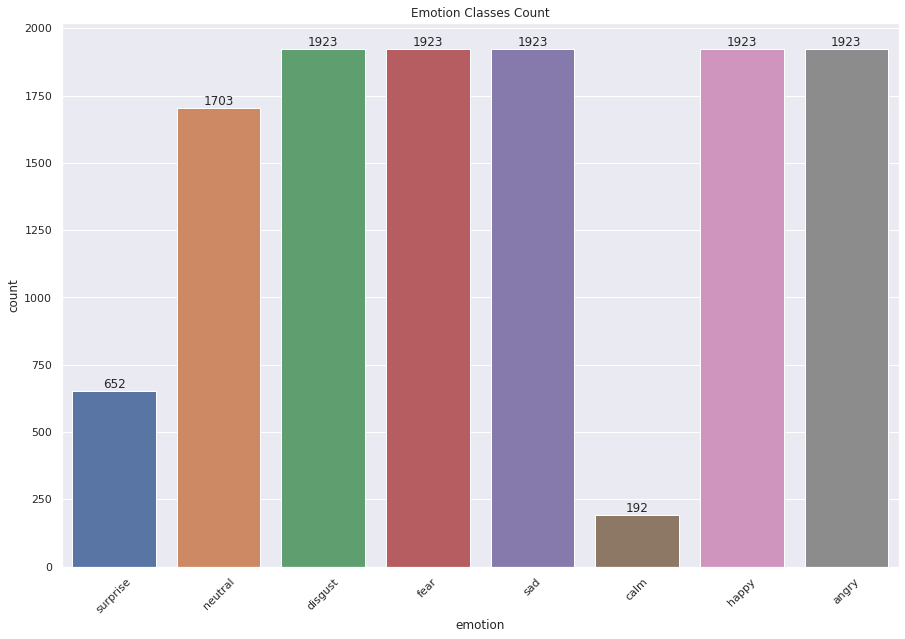

In [16]:
plt.figure(figsize = (15,10))
plt.title('Emotion Classes Count')
emotions = sns.countplot(x = 'emotion',data = comb_df)
emotions.set_xticklabels(emotions.get_xticklabels(),rotation = 45)
ax = sns.countplot(x = 'emotion', data = comb_df)
ax.bar_label(ax.containers[0])
plt.show()


In [17]:
fig = px.bar(data_frame = comb_df,
             x = comb_df['emotion'].value_counts().index,
             y = comb_df['emotion'].value_counts(),
             color = comb_df['emotion'].value_counts().index,
             labels={'x':'emotion', 'y':'count'},
             title = 'Emotion Classes Count')
fig.show()


In [18]:
comb_df['emotion'].value_counts()

labels = comb_df['emotion'].value_counts().index
values = comb_df['emotion'].value_counts().values
colors=['Lightskyblue']

fig = go.Figure(data=[go.Pie(labels = labels, values = values, textinfo = 'label+percent',
                             insidetextorientation = 'radial',marker = dict(colors = colors))])

fig.update_layout(title='Emotion Classes Counts')
fig.show()


## 1.14 Bar Graph and Pie Chart Of The Unique Genders


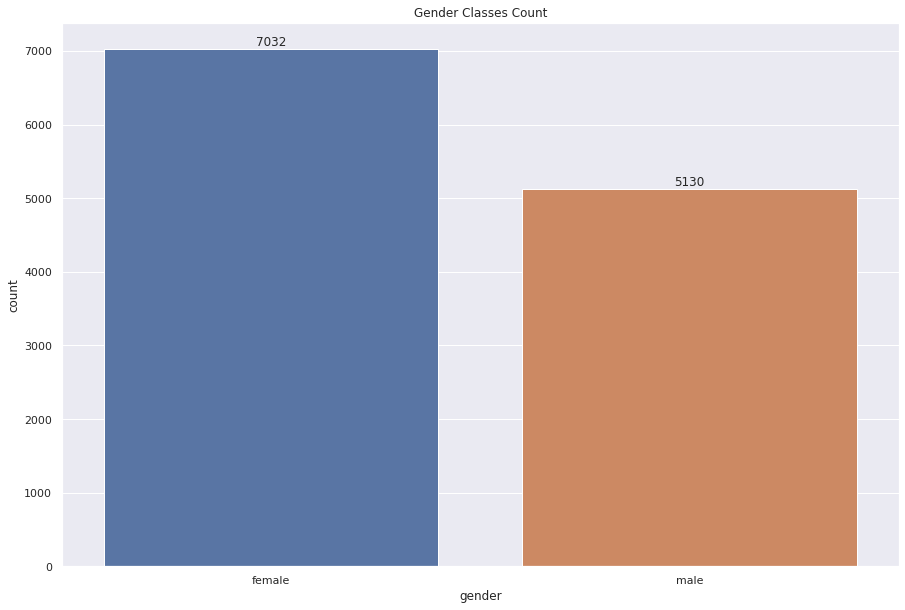

In [19]:
plt.figure(figsize = (15,10))
plt.title('Gender Classes Count')
genders = sns.countplot(x = 'gender',data = comb_df)
genders.set_xticklabels(genders.get_xticklabels())
ax = sns.countplot(x = 'gender', data = comb_df)
ax.bar_label(ax.containers[0])
plt.show()


In [20]:
fig = px.bar(data_frame = comb_df,
             x = comb_df['gender'].value_counts().index,
             y = comb_df['gender'].value_counts(),
             color = comb_df['gender'].value_counts().index,
             labels={'x':'gender', 'y':'count'},
             title = 'Gender Classes Count',
             width = 1240,
             height = 700)
fig.show()


In [21]:
comb_df['gender'].value_counts()

labels = comb_df['gender'].value_counts().index
values = comb_df['gender'].value_counts().values
colors = ['Red']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, textinfo = 'label+percent',
                             insidetextorientation = 'radial',marker = dict(colors = colors))])
fig.update_layout(title = 'Gender Classes Counts')
fig.show()


## 1.15 Set Color For Each Emotion


In [22]:
emotion_colors = {'surprise':'#19d3f3',
                'neutral':'#ffa15a',
                'disgust':'#87cefa',
                'fear':'#636efa',
                'sad':'#ef553b',
                'calm':'#ff6692',
                'happy':'#00cc96',
                'angry':'#ab63fa'}


## 1.16 Wave Plot For Each Emotion


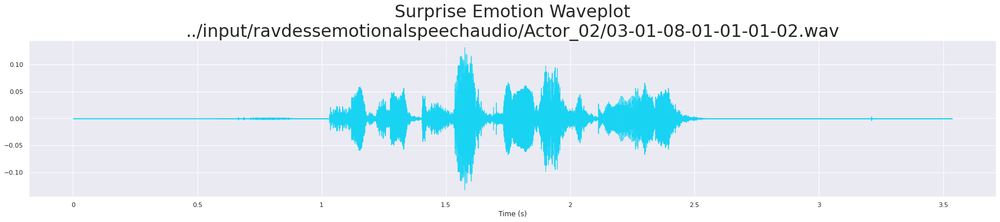

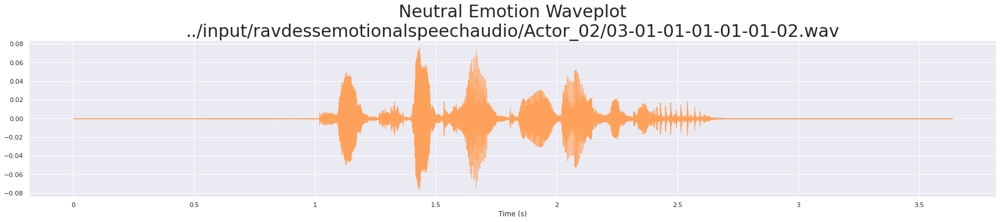

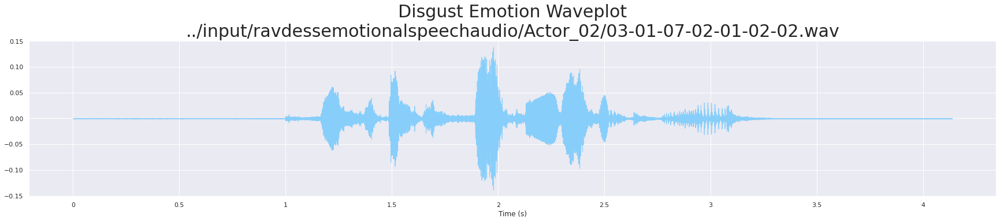

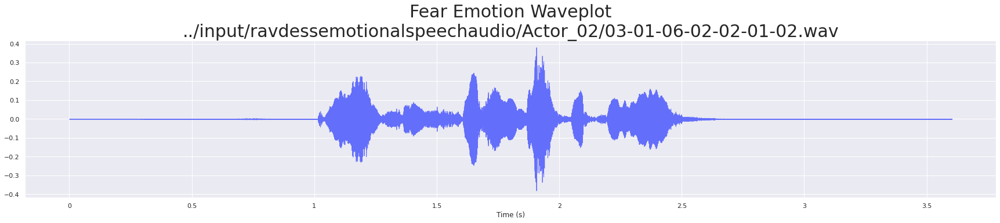

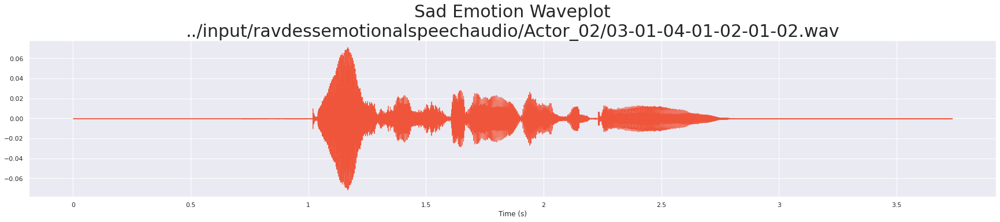

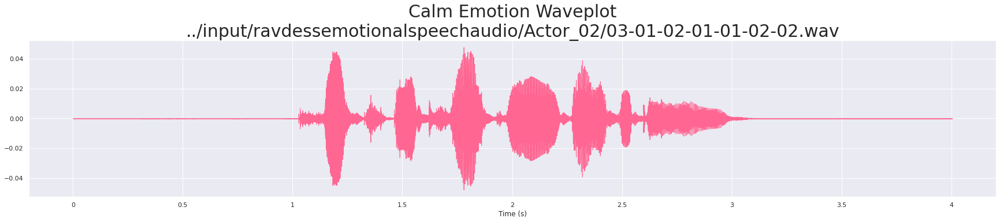

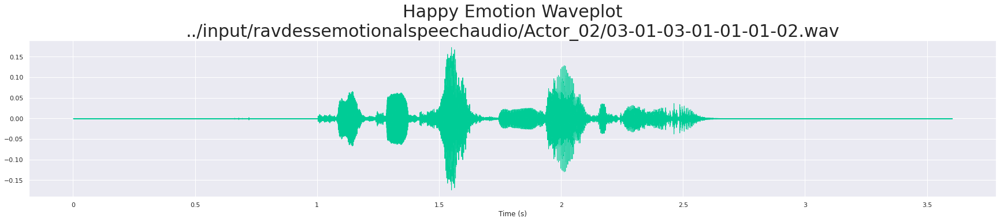

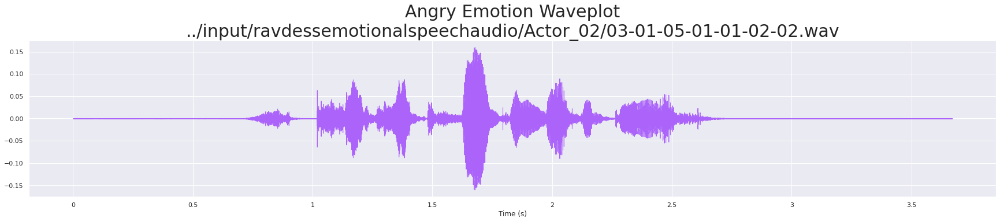

In [23]:
def wave_plot(audio_time_series, sampling_rate, emotion_class, emotion_color, file_path):
    plt.figure(figsize = (30, 5))
    librosa.display.waveshow(y = audio_time_series,sr = sampling_rate,color = emotion_color, x_axis = 's')
    plt.title(f'{emotion_class.capitalize()} Emotion Waveplot\n{file_path}', size = 30)


audio_path=[]
for emotion_class in emotions_classes:
    file_path = np.array(comb_df['location'][comb_df['emotion'] == emotion_class])[0]
    audio_time_series,sampling_rate = librosa.load(file_path)
    wave_plot(audio_time_series, sampling_rate, emotion_class, emotion_colors[emotion_class], file_path)


## 1.17 Spectogram For Each Emotion


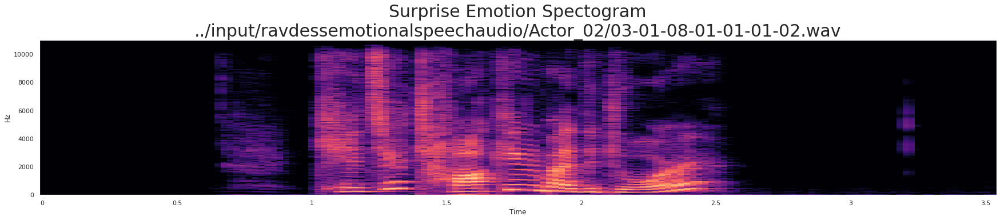

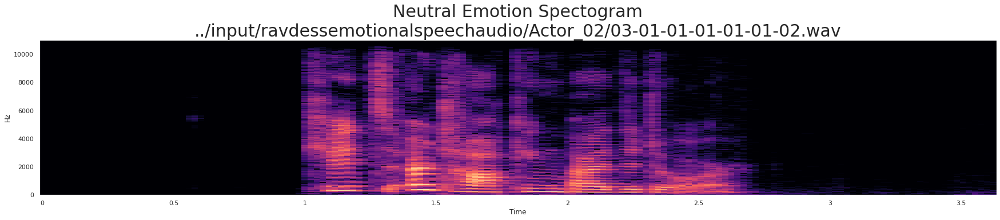

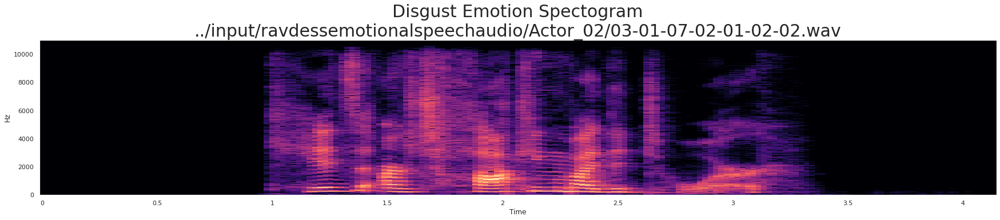

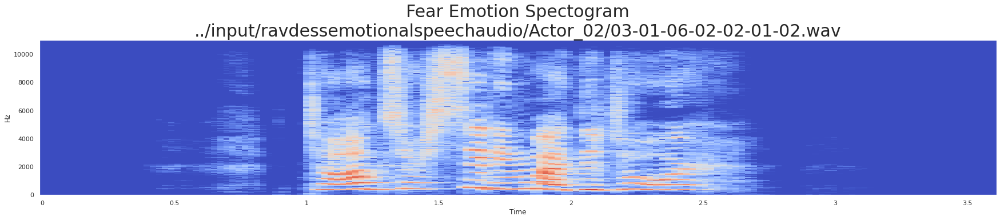

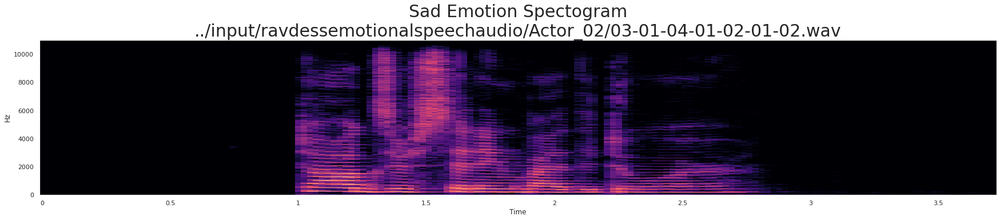

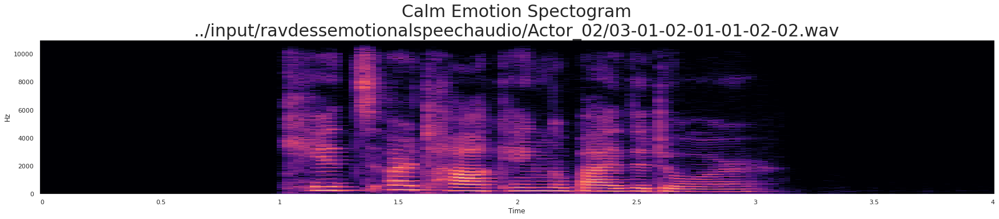

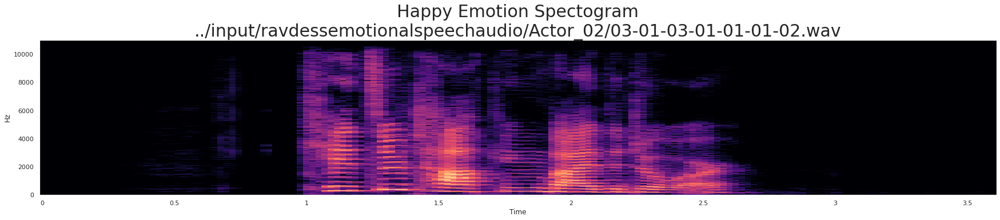

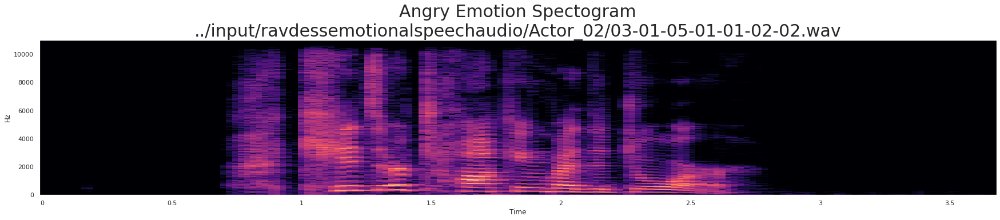

In [24]:
def spectogram(audio_time_series, sampling_rate, emotion_class, file_path):
    audio = librosa.stft(audio_time_series)
    audio_db = librosa.amplitude_to_db(abs(audio))
    plt.figure(figsize = (30,5))
    plt.title(f'{emotion_class.capitalize()} Emotion Spectogram\n{file_path}',size = 30)
    librosa.display.specshow(audio_db, sr = sampling_rate, x_axis = 'time', y_axis = 'hz')


audio_path=[]
for emotion_class in emotions_classes:
    file_path = np.array(comb_df['location'][comb_df['emotion'] == emotion_class])[0]
    audio_time_series, sampling_rate = librosa.load(file_path)
    spectogram(audio_time_series, sampling_rate, emotion_class, file_path)


## 1.18 Mel Spectogram For Each Emotion


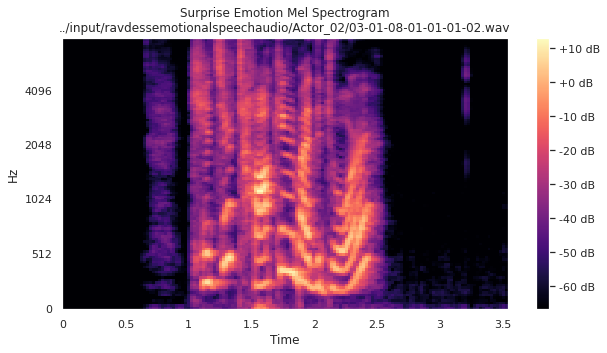

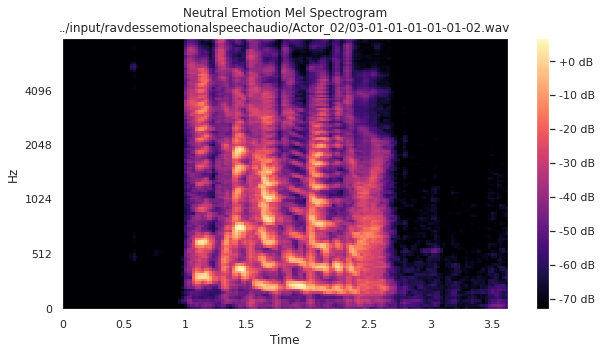

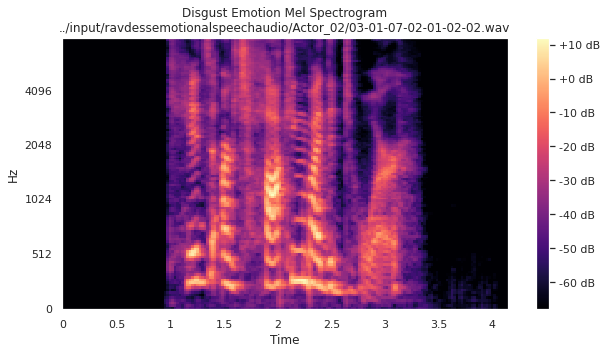

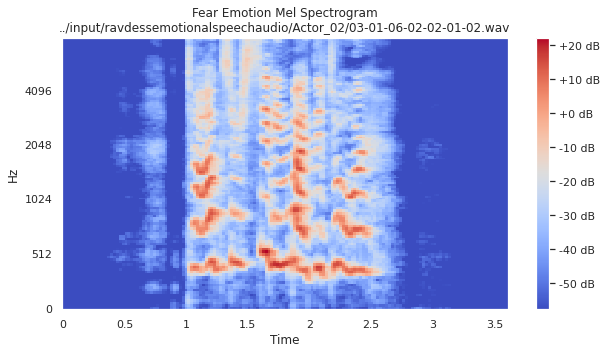

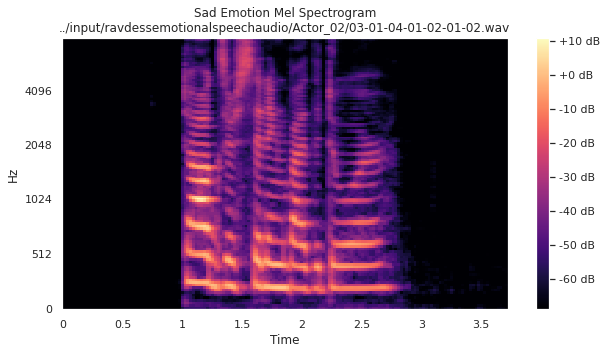

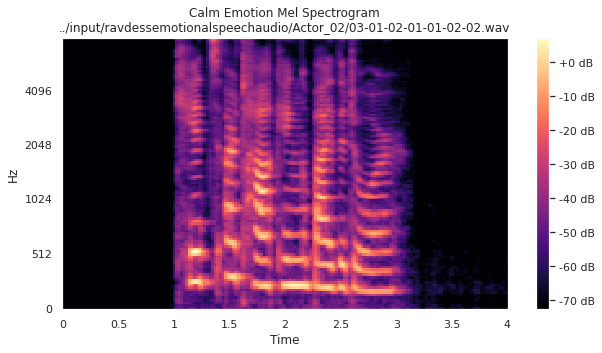

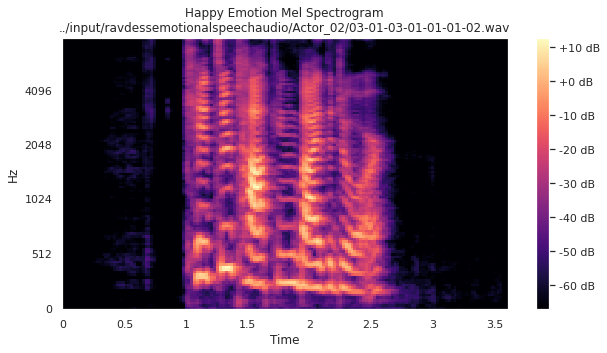

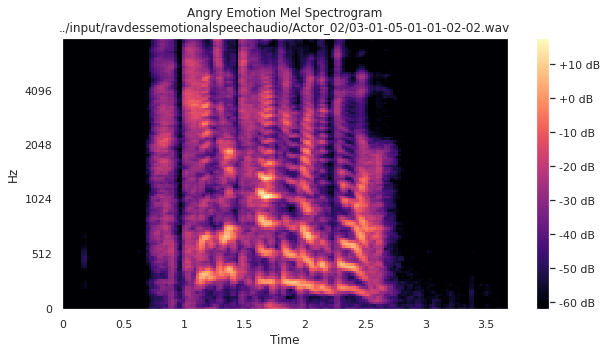

In [25]:
def mel_spectogram(audio_time_series, sampling_rate, emotion_class, file_path):
    spectrogram = librosa.feature.melspectrogram(y = audio_time_series, sr = sampling_rate, n_mels = 128,fmax = 8000) 
    spectrogram = librosa.power_to_db(spectrogram)
    plt.figure(figsize = (10, 5))
    plt.title(f'{emotion_class.capitalize()} Emotion Mel Spectrogram\n{file_path}')
    librosa.display.specshow(spectrogram, fmax = 8000, x_axis = 'time',y_axis = 'mel')
    plt.colorbar(format = '%+2.0f dB')


audio_path = []
for emotion_class in emotions_classes:
    file_path = np.array(comb_df['location'][comb_df['emotion'] == emotion_class])[0]
    audio_time_series, sampling_rate = librosa.load(file_path)
    mel_spectogram(audio_time_series, sampling_rate, emotion_class, file_path)
    audio_path.append(file_path)


## 1.19 Play The Sound File For Each Of The Emotions Above To Make Sure Sound Files Are Valid And Match The Waveform, Spectogram, and Mel Spectrogram Above.


In [26]:
print('emotions_classes =', emotions_classes,'\n')

for i in range(len(emotions_classes) - 1):
        print(emotions_classes[i].capitalize(), 'Audio Sample\n')
        print(audio_path[i])
        IPython.display.display(IPython.display.Audio(audio_path[i]))


emotions_classes = ['surprise' 'neutral' 'disgust' 'fear' 'sad' 'calm' 'happy' 'angry'] 

Surprise Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-08-01-01-01-02.wav


Neutral Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-01-01-01-01-02.wav


Disgust Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-07-02-01-02-02.wav


Fear Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-06-02-02-01-02.wav


Sad Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-04-01-02-01-02.wav


Calm Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-02-01-01-02-02.wav


Happy Audio Sample

../input/ravdessemotionalspeechaudio/Actor_02/03-01-03-01-01-01-02.wav


___
## #2 Select and Engineer Features


## 2.1 Audio Data Augmentation
> 1. Noise Injection
> 2. Shifting
> 3. Pitching
> 4. Stretching


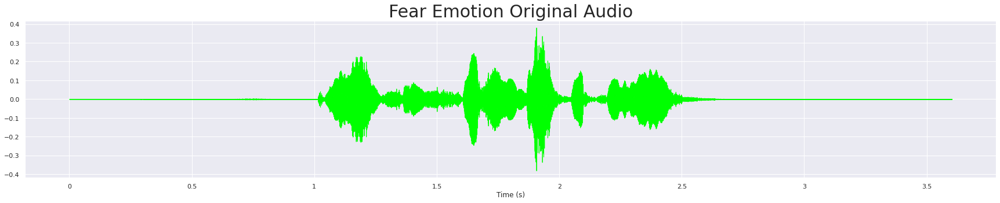

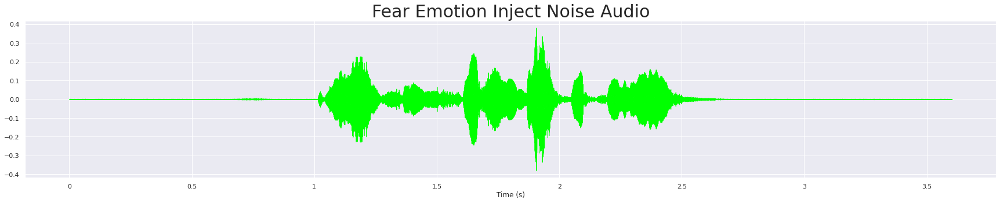

In [27]:
# Noise Injection
def inject_noise(data, random = False, rate = 0.035, threshold = 0.075):
    if random:
        rate = np.random.random() * threshold
    noise_amplitude = rate * np.random.uniform() * np.amax(data)
    augmented_data = data + noise_amplitude * np.random.normal(size = data.shape[0])
    return augmented_data


# Test audio file (fear emotion)
data, sampling_rate = librosa.load(audio_path[3])

IPython.display.display(IPython.display.Audio(audio_path[3]))

plt.figure(figsize = (30,5))
librosa.display.waveshow(data, sampling_rate, color = '#00ff00', x_axis = 's')
plt.title('Fear Emotion Original Audio', size = 30)

noise_audio = inject_noise(data)
plt.figure(figsize = (30,5))
librosa.display.waveshow(noise_audio, sampling_rate, color = '#00ff00', x_axis = 's')
plt.title('Fear Emotion Inject Noise Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(noise_audio, rate = sampling_rate))


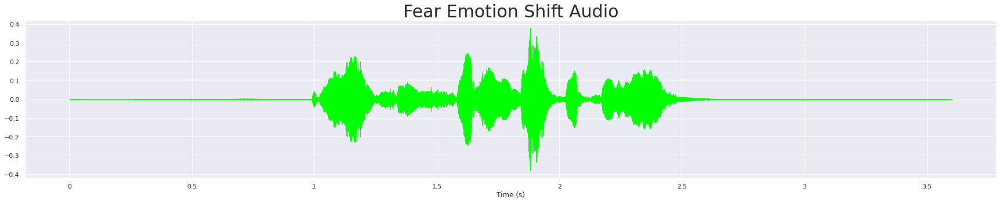

In [28]:
# Shifting
def shifting(data, rate = 1000):
    shift_range = int(np.random.uniform(low = -5, high = 5) * rate)
    shift_range = np.roll(data, shift_range)
    return shift_range

# Test audio file (fear emotion)
shift_audio = shifting(data)
plt.figure(figsize = (30,5))
librosa.display.waveshow(shift_audio, sampling_rate, color = '#00ff00', x_axis = 's')
plt.title('Fear Emotion Shift Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(shift_audio, rate = sampling_rate))


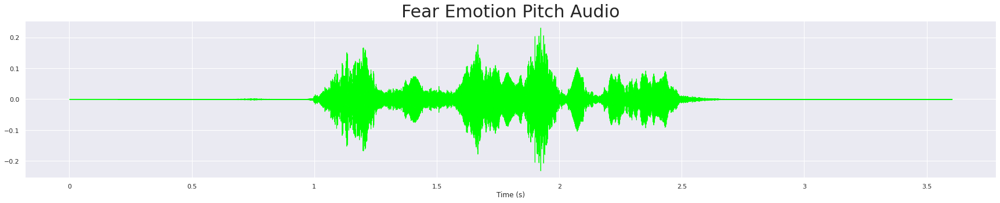

In [29]:
# Pitching
def pitching(data, sampling_rate, pitch_factor = 0.7,random = False):
    if random:
        pitch_factor= np.random.random() * pitch_factor
    return librosa.effects.pitch_shift(data, sampling_rate, pitch_factor)


# Test audio file (fear emotion)
pitch_audio = pitching(data, sampling_rate)
plt.figure(figsize = (30,5))
librosa.display.waveshow(pitch_audio, sampling_rate, color = '#00ff00', x_axis = 's')
plt.title('Fear Emotion Pitch Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(pitch_audio, rate = sampling_rate))


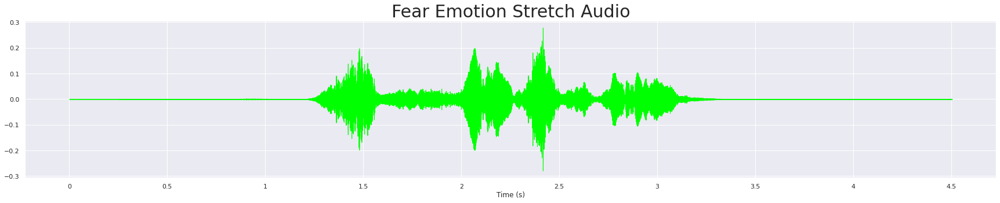

In [30]:
# Stretching
def streching(data,rate = 0.8):
    return librosa.effects.time_stretch(data, rate)


# Test audio file (fear emotion)
stretch_audio = streching(data)
plt.figure(figsize = (30,5))
librosa.display.waveshow(stretch_audio, sampling_rate, color = '#00ff00', x_axis = 's')
plt.title('Fear Emotion Stretch Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(stretch_audio, rate = sampling_rate))


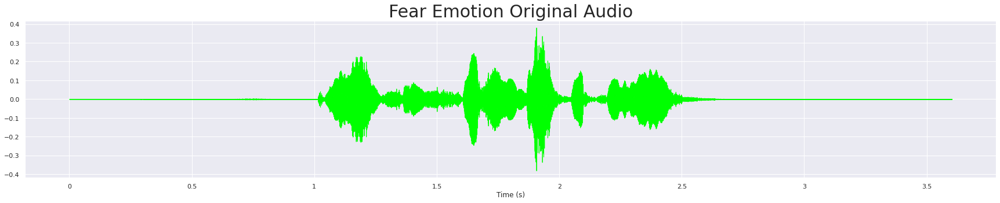

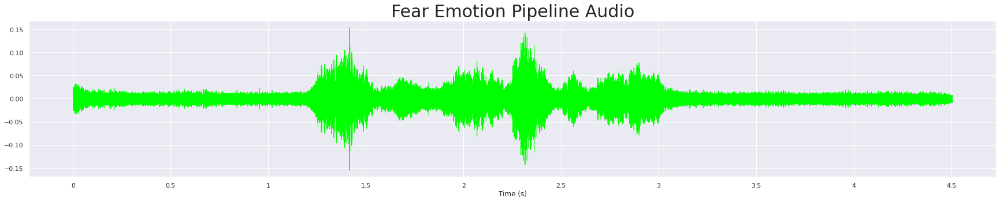

In [31]:
# Pipeline function that applies all the audio data augmentation functions we just built.
def pipeline(data, sampling_rate):
    data = inject_noise(data)
    data = shifting(data)
    data = pitching(data, sampling_rate)
    data = streching(data)
    return data

# Test audio file (fear emotion)
data, sampling_rate = librosa.load(audio_path[3])

IPython.display.display(IPython.display.Audio(audio_path[3]))

plt.figure(figsize = (30,5))
librosa.display.waveshow(data, sampling_rate, color = '#00ff00', x_axis = 's')
plt.title('Fear Emotion Original Audio', size = 30)

pipeline_audio = pipeline(data, sampling_rate)
plt.figure(figsize = (30,5))
librosa.display.waveshow(pipeline_audio, sampling_rate, color = '#00ff00', x_axis = 's')
plt.title('Fear Emotion Pipeline Audio', size = 30)
plt.show()
IPython.display.display(IPython.display.Audio(pipeline_audio, rate = sampling_rate))


## 2.2 Audio Data Feature Extraction
> 1. __Zero Crossing Rate:__
> 2. __Root Mean Square:__
> 3. __Mel Frequency Cepstral Coefficients:__

>> ___Below are additional Audio Data Features Extraction that can be done if model is not accurate enough.___

> 4. __Energy:__ Sum of squares of the signal values, normalized by the respective frame length.
> 5. __Entropy of Energy:__ Entropy of sub-frames’ normalized energies. It can be interpreted as a measure of abrupt changes.
> 6. __Spectral Centroid:__ Center of gravity of the spectrum.
> 7. __Spectral Spread:__ Second central moment of the spectrum.
> 9. __Spectral Entropy:__ Entropy of the normalized spectral energies for a set of sub-frames.
> 9. __Spectral Flux:__ Squared difference between the normalized magnitudes of the spectra of the two successive frames.
> 10. __Spectral Rolloff:__ Frequency below which 90% of the magnitude distribution of the spectrum is concentrated.


In [32]:
def zero_crossing_rate(data,frame_length, hop_length):
    zcr = librosa.feature.zero_crossing_rate(y = data, frame_length = frame_length, hop_length = hop_length)
    return np.squeeze(zcr)

def root_mean_square(data, frame_length = 2048, hop_length = 512):
    rms = librosa.feature.rms(y = data, frame_length = frame_length, hop_length = hop_length)
    return np.squeeze(rms)

def mel_frequency_cepstral_coefficients(data, sampling_rate, frame_length = 2048, hop_length = 512, flatten:bool = True):
    mfcc = librosa.feature.mfcc(y = data,sr = sampling_rate)
    return np.squeeze(mfcc.T) if not flatten else np.ravel(mfcc.T)


In [33]:
def feature_extraction(data, sampling_rate, frame_length = 2048, hop_length = 512):
    result = np.array([])
    
    result = np.hstack((result,
                      zero_crossing_rate(data, frame_length, hop_length),
                      root_mean_square(data, frame_length, hop_length),
                      mel_frequency_cepstral_coefficients(data, sampling_rate, frame_length, hop_length)
                     ))
    return result


In [34]:
#  Duration and offset act as placeholders because there is no audio in start and the ending of each audio file is noramlly below three seconds.
def get_features(file_path, duration = 2.5, offset = 0.6):
    data, sampling_rate = librosa.load(file_path, duration = duration, offset = offset)
    
    # No audio data augmentation
    audio_1 = feature_extraction(data, sampling_rate)
    audio = np.array(audio_1)
    
    # Inject Noise
    noise_audio = inject_noise(data, random = True)
    audio_2 =  feature_extraction(noise_audio, sampling_rate)
    audio = np.vstack((audio, audio_2))
    
    # Pitching
    pitch_audio = pitching(data, sampling_rate, random = True)
    audio_3 = feature_extraction(pitch_audio, sampling_rate)
    audio = np.vstack((audio, audio_3))
    
    # Pitching and Inject Noise
    pitch_audio_1 = pitching(data, sampling_rate, random = True)
    pitch_noise_audio = inject_noise(pitch_audio_1, random = True)
    audio_4 = feature_extraction(pitch_noise_audio, sampling_rate)
    audio = np.vstack((audio, audio_4))
    
    audio_features = audio
    
    return audio


## 2.3 Extract Audio Data Features From Each Audio File


In [ ]:
features_list = []
genders_list = []
emotions_list = []
locations_list = []

print('Audio Data - Features Extraction Starts')

for gender, emotion, file_path, index in zip(comb_df.gender, comb_df.emotion, comb_df.location, tqdm(range(comb_df.location.shape[0]))):
    features = get_features(file_path)    
    
    if index % 1 == 0:
        print(index, ' audio files have been feature extracted(', round(index / 12162 * 100), '%)\r', sep = '', end = '')
    
    for i in features:
        features_list.append(i)
        genders_list.append(gender)
        emotions_list.append(emotion)
        locations_list.append(file_path)


print('Audio Data - Features Extraction Ends')


## 2.4 Convert The Audio Data Features From Each Audio File To A Dataframe.


In [ ]:
audio_features_df = pd.DataFrame(features_list)
audio_features_df['gender'] = genders_list
audio_features_df['emotion'] = emotions_list
audio_features_df['location'] = locations_list


In [ ]:
print('audio_features_df.shape =', audio_features_df.shape, '\n')

print(audio_features_df.isnull().sum(), '\n')
print('audio_features_df.isnull().sum().sum() = ', audio_features_df.isnull().sum().sum())

print('audio_features_df.duplicated().sum() = ', audio_features_df.duplicated().sum())


audio_features_df


## 2.4 Convert The Audio Data Features From Each Audio File To A .csv File For Future Reference So That We Can Load It Without Doing The Feature Extraction Again.


In [ ]:
audio_features_df.to_csv('./audio_features.csv', index = False)


In [35]:
# This is used to load the .csv file into the audio_features_df whenever necessary.
#audio_features_df = pd.read_csv('../input/audiofeatures/audio_features.csv')


## 2.5 Inspect / Replace null Values


In [36]:
print('audio_features_df.shape =', audio_features_df.shape, '\n')
print('audio_features_df.isna().sum().sum() =', audio_features_df.isna().sum().sum(), '\n')
print(audio_features_df.isna().any())
print()
audio_features_df.isnull().sum(axis = 0)

print('Replacing NaN values with 0.\n')
audio_features_df = audio_features_df.fillna(0)

print('audio_features_df.shape =', audio_features_df.shape, '\n')
print('audio_features_df.isna().sum().sum() =', audio_features_df.isna().sum().sum(), '\n')
print(audio_features_df.isna().any())
print()
audio_features_df.isnull().sum(axis = 0)


audio_features_df.shape = (48648, 2379) 

audio_features_df.isna().sum().sum() = 28245624 

0           False
1           False
2           False
3           False
4           False
            ...  
2374         True
2375         True
gender      False
emotion     False
location    False
Length: 2379, dtype: bool

Replacing NaN values with 0.

audio_features_df.shape = (48648, 2379) 

audio_features_df.isna().sum().sum() = 0 

0           False
1           False
2           False
3           False
4           False
            ...  
2374        False
2375        False
gender      False
emotion     False
location    False
Length: 2379, dtype: bool



0           0
1           0
2           0
3           0
4           0
           ..
2374        0
2375        0
gender      0
emotion     0
location    0
Length: 2379, dtype: int64

## 2.6 Inspect/ Remove Duplicate Rows

In [37]:
print('audio_features_df.duplicated().sum() = ', audio_features_df.duplicated().sum())

duplicate = audio_features_df[audio_features_df.duplicated()]

print('Duplicate Rows:')

duplicate


audio_features_df.duplicated().sum() =  2
Duplicate Rows:


,0,1,2,3,4,5,6,7,8,9,...,2369,2370,2371,2372,2373,2374,2375,gender,emotion,location
32458,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,female,sad,../input/cremad/AudioWAV//1076_MTI_SAD_XX.wav
32459,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,female,sad,../input/cremad/AudioWAV//1076_MTI_SAD_XX.wav


### Four Times More Rows Than The Original/Initial Dataset Because For Each Audio File We Now Have Four Rows Representing:
1. No Audio Data Augmentation (first row)
2. Inject Noise (second row)
3. Pitching (third row)
4. Pitching and Inject Noise (fourth row)


In [38]:
print('audio_features_df.shape =', audio_features_df.shape)

audio_features_df = audio_features_df.drop_duplicates()

print('audio_features_df.duplicated().sum() =', audio_features_df.duplicated().sum())

print('audio_features_df.shape =', audio_features_df.shape)

audio_features_df


audio_features_df.shape = (48648, 2379)
audio_features_df.duplicated().sum() = 0
audio_features_df.shape = (48646, 2379)


,0,1,2,3,4,5,6,7,8,9,...,2369,2370,2371,2372,2373,2374,2375,gender,emotion,location
0,0.331543,0.471680,0.564941,0.452148,0.374512,0.296875,0.265137,0.256348,0.252441,0.251953,...,-1.599245,-1.234544,-0.693115,-0.038821,0.675410,1.405862,2.112551,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
1,0.246094,0.357910,0.490234,0.488281,0.486328,0.500000,0.491699,0.487793,0.491211,0.498047,...,1.078767,-0.407423,6.408318,0.799663,0.199998,6.114203,3.663695,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
2,0.297363,0.416992,0.520508,0.453613,0.373535,0.321777,0.279297,0.259766,0.254883,0.250000,...,1.070771,1.095651,1.240447,1.484359,1.804016,2.175152,2.573987,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
3,0.249023,0.367676,0.490234,0.482910,0.489258,0.496582,0.499023,0.502930,0.501465,0.506836,...,0.772563,-2.115209,1.036688,-2.520699,-7.863402,2.666174,4.152795,female,surprise,../input/ravdessemotionalspeechaudio/Actor_02/...
4,0.400879,0.591309,0.783203,0.777832,0.771973,0.777832,0.771973,0.775391,0.758789,0.580078,...,2.223155,0.986784,-0.730886,-2.531058,-4.002848,-4.849192,-4.929412,female,neutral,../input/ravdessemotionalspeechaudio/Actor_02/...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48643,0.023438,0.033691,0.046875,0.044434,0.046387,0.058105,0.078613,0.093262,0.102051,0.098145,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
48644,0.042480,0.059570,0.069336,0.058594,0.038086,0.026367,0.027344,0.031250,0.037109,0.041992,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
48645,0.053223,0.087891,0.135742,0.172852,0.201172,0.226562,0.239258,0.213867,0.168945,0.121094,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...
48646,0.048340,0.066895,0.077148,0.070312,0.044434,0.035156,0.035645,0.035645,0.041504,0.043457,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,female,surprise,../input/torontoemotionalspeechsettess/YAF_ple...


## 2.7 Print Out The Number Examples In Each Class (aka the class balances)


In [39]:
audio_features_df.emotion.value_counts(), audio_features_df.emotion.value_counts(normalize = True)


(disgust     7692
 fear        7692
 happy       7692
 angry       7692
 sad         7690
 neutral     6812
 surprise    2608
 calm         768
 Name: emotion, dtype: int64,
 disgust     0.158122
 fear        0.158122
 happy       0.158122
 angry       0.158122
 sad         0.158081
 neutral     0.140032
 surprise    0.053612
 calm        0.015788
 Name: emotion, dtype: float64)

## 2.8 Print Out The Number Of Unique Emotions


In [40]:
emotions_classes = audio_features_df['emotion'].unique()
print(emotions_classes)


['surprise' 'neutral' 'disgust' 'fear' 'sad' 'calm' 'happy' 'angry']


## 2.9 Split Our Data Into Training (80%), Validating (10%), and Testing (10%) Sets


In [41]:
X = audio_features_df.drop(labels = ['emotion', 'gender', 'location'], axis = 1)
y = audio_features_df['emotion']


In [42]:
X

,0,1,2,3,4,5,6,7,8,9,...,2366,2367,2368,2369,2370,2371,2372,2373,2374,2375
0,0.331543,0.471680,0.564941,0.452148,0.374512,0.296875,0.265137,0.256348,0.252441,0.251953,...,-0.948772,-1.517647,-1.716411,-1.599245,-1.234544,-0.693115,-0.038821,0.675410,1.405862,2.112551
1,0.246094,0.357910,0.490234,0.488281,0.486328,0.500000,0.491699,0.487793,0.491211,0.498047,...,-1.254112,-3.412512,-2.933101,1.078767,-0.407423,6.408318,0.799663,0.199998,6.114203,3.663695
2,0.297363,0.416992,0.520508,0.453613,0.373535,0.321777,0.279297,0.259766,0.254883,0.250000,...,1.840844,1.438467,1.181941,1.070771,1.095651,1.240447,1.484359,1.804016,2.175152,2.573987
3,0.249023,0.367676,0.490234,0.482910,0.489258,0.496582,0.499023,0.502930,0.501465,0.506836,...,-4.024306,-0.733742,2.392814,0.772563,-2.115209,1.036688,-2.520699,-7.863402,2.666174,4.152795
4,0.400879,0.591309,0.783203,0.777832,0.771973,0.777832,0.771973,0.775391,0.758789,0.580078,...,2.004560,2.585884,2.746578,2.223155,0.986784,-0.730886,-2.531058,-4.002848,-4.849192,-4.929412
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48643,0.023438,0.033691,0.046875,0.044434,0.046387,0.058105,0.078613,0.093262,0.102051,0.098145,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
48644,0.042480,0.059570,0.069336,0.058594,0.038086,0.026367,0.027344,0.031250,0.037109,0.041992,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
48645,0.053223,0.087891,0.135742,0.172852,0.201172,0.226562,0.239258,0.213867,0.168945,0.121094,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
48646,0.048340,0.066895,0.077148,0.070312,0.044434,0.035156,0.035645,0.035645,0.041504,0.043457,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [43]:
y

0        surprise
1        surprise
2        surprise
3        surprise
4         neutral
           ...   
48643    surprise
48644    surprise
48645    surprise
48646    surprise
48647    surprise
Name: emotion, Length: 48646, dtype: object

In [44]:
label = LabelEncoder()

y = np_utils.to_categorical(label.fit_transform(y))

print(label.classes_)

y


['angry' 'calm' 'disgust' 'fear' 'happy' 'neutral' 'sad' 'surprise']


array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [45]:
X_train, X_remain, y_train, y_remain = train_test_split(
    X, y, test_size = 0.2, random_state = 42)

print('X_remain.shape = ', X_remain.shape)
print('y_remain.shape = ', y_remain.shape)

X_valid, X_test, y_valid, y_test = train_test_split(
    X_remain, y_remain, test_size = 0.5, random_state = 42)

print('X_train.shape = ', X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_valid.shape = ', X_valid.shape)
print('y_valid.shape = ', y_valid.shape)
print('X_test.shape  = ', X_test.shape)
print('y_test.shape  = ', y_test.shape)


X_remain.shape =  (9730, 2376)
y_remain.shape =  (9730, 8)
X_train.shape =  (38916, 2376)
y_train.shape =  (38916, 8)
X_valid.shape =  (4865, 2376)
y_valid.shape =  (4865, 8)
X_test.shape  =  (4865, 2376)
y_test.shape  =  (4865, 8)


In [46]:
# Standardize / Scale data.
# Standardize features by removing the mean and scaling to unit variance.
# z = (x - u) / s

standard_scaler = StandardScaler()
X_train = standard_scaler.fit_transform(X_train)
X_valid = standard_scaler.transform(X_valid)
X_test = standard_scaler.transform(X_test)

print('X_train.shape = ', X_train.shape)
print('X_remain.shape = ', X_remain.shape)
print('X_valid.shape = ', X_valid.shape)
print('X_test.shape  = ', X_test.shape)


X_train.shape =  (38916, 2376)
X_remain.shape =  (9730, 2376)
X_valid.shape =  (4865, 2376)
X_test.shape  =  (4865, 2376)


In [47]:
# Modify data to fit into a 1D-CNN.

X_train = np.expand_dims(X_train, axis = 2)
X_valid = np.expand_dims(X_valid, axis = 2)
X_test = np.expand_dims(X_test, axis = 2)

print('X_train.shape = ', X_train.shape)
print('X_remain.shape = ', X_remain.shape)
print('X_valid.shape = ', X_valid.shape)
print('X_test.shape  = ', X_test.shape)


X_train.shape =  (38916, 2376, 1)
X_remain.shape =  (9730, 2376)
X_valid.shape =  (4865, 2376, 1)
X_test.shape  =  (4865, 2376, 1)


In [48]:
print('X_train.shape', X_train.shape)
print('X_valid.shape', X_valid.shape)
print('X_test.shape', X_test.shape)

print('y_train.shape', y_train.shape)
print('y_valid.shape', y_valid.shape)
print('y_test.shape', y_test.shape)

X_train.shape (38916, 2376, 1)
X_valid.shape (4865, 2376, 1)
X_test.shape (4865, 2376, 1)
y_train.shape (38916, 8)
y_valid.shape (4865, 8)
y_test.shape (4865, 8)


____
## #3 Build and Train Model


## 3.1 Build / Define The Model
### __Create The Neural Netowrk__


In [49]:
early_stopping = EarlyStopping(monitor = 'val_accuracy',
                               patience = 10,
                               mode = 'auto',
                               restore_best_weights = True)


In [50]:
reduce_learning_rate = ReduceLROnPlateau(monitor ='val_accuracy',
                                            factor = 0.5,
                                            verbose = 1,
                                            min_lr = 0.00001)


In [51]:
# Create the neural network.

model = models.Sequential()

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu', input_shape = (X_train.shape[1], 1)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 512, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 256, kernel_size = 5, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 256, kernel_size = 3, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling1D(pool_size = 5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(filters = 128, kernel_size = 3, strides = 1, padding = 'same', activation = 'relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling1D(pool_size = 3, strides = 2, padding = 'same'))

model.add(layers.Flatten())

model.add(layers.Dense(units = 512, activation = 'relu'))

model.add(layers.BatchNormalization())

model.add(layers.Dense(units = 8, activation = 'softmax'))

model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics=['accuracy'])

print(model.summary())


2022-10-31 07:28:51.393183: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-31 07:28:51.397669: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-31 07:28:51.398912: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-31 07:28:51.401496: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 2376, 512)         3072      
_________________________________________________________________
batch_normalization (BatchNo (None, 2376, 512)         2048      
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 1188, 512)         0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 1188, 512)         1311232   
_________________________________________________________________
batch_normalization_1 (Batch (None, 1188, 512)         2048      
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 594, 512)          0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 594, 512)          1

## 3.3 Train The Model For A Fixed Number Of Epochs
### If there is a need to store the history_callback_object, then you should use pickle.


In [ ]:
history_callback_object = model.fit(x = X_train, y = y_train, batch_size = 64, epochs = 43, callbacks = [early_stopping, reduce_learning_rate], validation_data = (X_valid, y_valid))


## 3.4 Save The Model


In [ ]:
file_path_model = './model.h5'

model.save(file_path_model)


In [52]:
# This is used to load the model whenever necessary.
#file_path_model = '../input/veractpmodel/model.h5'

#model = load_model(file_path_model)


___
## #4 Evaluate Model


## 4.1 Model Loss Graph


In [ ]:
fig = px.line(data_frame = history_callback_object.history,
              y = ['loss', 'val_loss'],
              labels = {'index':'Epoch', 'value':'Loss'},
              title = 'Loss vs Epoch')
fig.show()

history_callback_object.history.keys()


## 4.2 Model Accuracy Graph


In [ ]:
fig = px.line(data_frame = history_callback_object.history,
              y = ['accuracy', 'val_accuracy'],
              labels = {'index':'Epoch', 'value':'Accuracy'},
              title = 'Accuracy vs Epoch')
fig.show()

history_callback_object.history.keys()


## 4.3 Side To Side Model Loss And Accuracy Graphs


In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.plot(history_callback_object.history['loss'], label = 'loss')
ax1.plot(history_callback_object.history['val_loss'], label = 'val_loss')
ax1.legend()
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Loss vs Epoch')
ax1.grid(True)

ax2.plot(history_callback_object.history['accuracy'], label = 'accuracy')
ax2.plot(history_callback_object.history['val_accuracy'], label = 'val_accuracy')
ax2.legend()
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.set_title('Accuracy vs Epoch')
ax2.grid(True)

fig.set_figheight(10)
fig.set_figwidth(35)
plt.show()

history_callback_object.history.keys()


## 4.4 Make And Evaluate New Predictions Using Our Testing Data


In [53]:
# y_pred stores the probabilities for each emotion. The highest probability corresponds to the predicted emotion.
y_pred = model.predict(X_test)
print(y_pred[0])
y_pred


2022-10-31 07:33:54.055858: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-10-31 07:33:55.091714: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


[5.84082249e-09 1.12572778e-08 3.77530960e-04 1.11884646e-07
 9.99537468e-01 8.48663622e-05 3.84946937e-08 1.30920760e-10]


array([[5.84082249e-09, 1.12572778e-08, 3.77530960e-04, ...,
        8.48663622e-05, 3.84946937e-08, 1.30920760e-10],
       [9.98708725e-01, 3.01551457e-11, 5.38861286e-06, ...,
        7.16535053e-14, 7.49845412e-08, 8.76366976e-04],
       [1.35407863e-08, 1.88056602e-11, 1.08698196e-10, ...,
        3.65944501e-08, 5.40645176e-12, 1.50999171e-10],
       ...,
       [2.40512360e-10, 9.11123843e-10, 1.08806453e-05, ...,
        8.68400037e-01, 5.56697929e-03, 1.85688090e-10],
       [8.56093234e-12, 5.88171942e-11, 1.86537640e-04, ...,
        1.39007152e-08, 9.99813378e-01, 7.40607408e-15],
       [1.57634492e-08, 2.66404017e-11, 4.53666618e-11, ...,
        7.91427146e-10, 4.64825201e-09, 2.69239284e-02]], dtype=float32)

In [54]:
y_pred = np.argmax(y_pred, axis = 1)
print(y_pred[0])
y_pred


4


array([4, 0, 4, ..., 5, 6, 3])

In [55]:
y_check = np.argmax(y_test, axis = 1)
print(y_check[0])
y_check


4


array([4, 0, 4, ..., 5, 6, 7])

In [56]:
print('Accuracy of model on test data: ', model.evaluate(X_test, y_test)[1] * 100 , '%', sep = '')


153/153 [==============================] - 5s 30ms/step - loss: 0.1508 - accuracy: 0.9642
Accuracy of model on test data: 96.42343521118164%


In [57]:
model_loss, model_accuracy = model.evaluate(X_test, y_test)

print('Model Test Loss: %f' % (model_loss))
print('Model Test Loss: %f' % (model_loss * 100), '%\n', sep = '')
print('Model Test Accuracy: %f' % (model_accuracy))
print('Model Test Accuracy: %f' % (model_accuracy * 100), '%', sep = '')


153/153 [==============================] - 5s 30ms/step - loss: 0.1508 - accuracy: 0.9642
Model Test Loss: 0.150776
Model Test Loss: 15.077622%

Model Test Accuracy: 0.964234
Model Test Accuracy: 96.423435%


In [58]:
# Calculate our accuracy score.
accuracy = accuracy_score(y_check, y_pred)

# Calculate our precision score.
precision = precision_score(y_check, y_pred, average = 'micro')

# Calculate our recall score.
recall = recall_score(y_check, y_pred, average = 'micro')

# Calculate our f1-score.
f1 = f1_score(y_check, y_pred, average = 'micro')

# Print each of our scores to inspect performance.
print('Accuracy Score: %f' % (accuracy * 100), '%', sep = '')
print('Precision Score: %f' % (precision * 100), '%', sep = '')
print('Recall Score: %f' % (recall * 100), '%', sep = '')
print('F1 Score: %f' % (f1 * 100), '%', sep = '')


Accuracy Score: 96.423433%
Precision Score: 96.423433%
Recall Score: 96.423433%
F1 Score: 96.423433%


## 4.5 Confusion Matrix


[[[4093   17]
  [  41  714]]

 [[4780    7]
  [   1   77]]

 [[4035   27]
  [  21  782]]

 [[4041   47]
  [  33  744]]

 [[4032   27]
  [  39  767]]

 [[4189   20]
  [  15  641]]

 [[4115   20]
  [  16  714]]

 [[4596    9]
  [   8  252]]] 



          surprise  neutral  disgust  fear  sad  calm  happy  angry
surprise       714        0       10    16   12     2      1      0
neutral          0       77        0     0    0     0      1      0
disgust          5        2      782     2    4     1      6      1
fear             5        0        7   744    8     2      8      3
sad              5        0        3    18  767     8      1      4
calm             1        3        2     5    1   641      3      0
happy            0        1        4     3    0     7    714      1
angry            1        1        1     3    2     0      0    252 





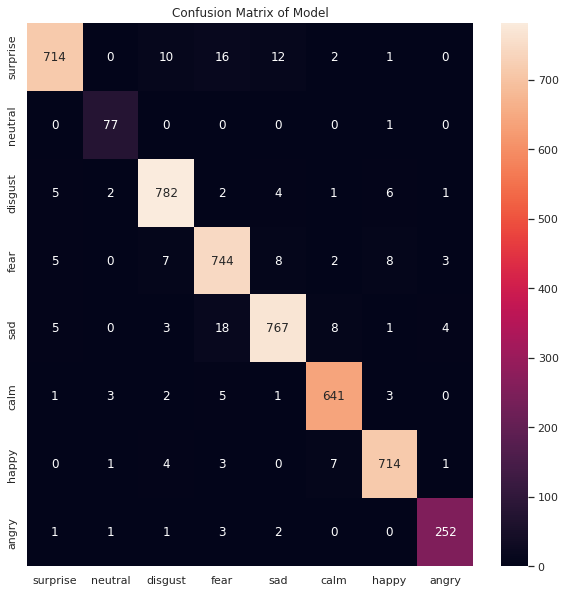

In [59]:
fig = plt.figure(figsize=(10, 10))
plt.title('Confusion Matrix of Model')
plt.xlabel('Predicted')
plt.ylabel('Actual')

cm = multilabel_confusion_matrix(y_check, y_pred)
print(cm, '\n\n\n')

model_matrix = confusion_matrix(y_check, y_pred)
cm = pd.DataFrame(model_matrix,
                  index = [i for i in emotions_classes],
                  columns = [i for i in emotions_classes]
                 )


ax = sns.heatmap(cm,
                 annot = True,
                 fmt = 'd',cbar=True)

print(cm, '\n\n\n')

plt.show()


## 4.6 Classification Report


In [60]:
print('Model Classification Report\n', classification_report(y_check, y_pred, target_names = emotions_classes))


Model Classification Report
               precision    recall  f1-score   support

    surprise       0.98      0.95      0.96       755
     neutral       0.92      0.99      0.95        78
     disgust       0.97      0.97      0.97       803
        fear       0.94      0.96      0.95       777
         sad       0.97      0.95      0.96       806
        calm       0.97      0.98      0.97       656
       happy       0.97      0.98      0.98       730
       angry       0.97      0.97      0.97       260

    accuracy                           0.96      4865
   macro avg       0.96      0.97      0.96      4865
weighted avg       0.96      0.96      0.96      4865



## 4.7 Predict An Unknown Audion File(outside from the four used data sets) In A .wav Format


In [61]:
# Increase ndarray dimensions to [4,2376].
def increase_ndarray_size(features_test):
    tmp = np.zeros([4, 2377])
    offsets = [0, 1]
    insert_here = [slice(offsets[dim], offsets[dim] + features_test.shape[dim]) for dim in range(features_test.ndim)]
    tmp[insert_here] = features_test
    features_test = tmp
    features_test = np.delete(features_test, 0, axis=1)
    return features_test


In [62]:
# Make the prediction.
def predict(features_test):
    features_test = standard_scaler.transform(features_test)
    features_test = np.expand_dims(features_test, axis = 2)
    print('features_test.shape = ', features_test.shape)

    y_pred = model.predict(features_test)
    print('Probabilities for each and every emotion for each and every feature extraction.\n\n',y_pred)
    y_pred = np.argmax(y_pred, axis = 1)
    print('\nPredicted emotion for each and every feature extraction.\n\n', y_pred)
    print('\nemotions_classes = ', emotions_classes)
    print('\nModel predicted emotion: ', emotions_classes[y_pred[0]])
    print('************************************************')
    

In [63]:
features_test = get_features('../input/cremad/AudioWAV/1001_DFA_DIS_XX.wav')

# Each audio data extraction has its own array.
print(len(features_test))

print('features_test.shape = ', features_test.shape)


if features_test.shape[1] < 2376:
    features_test = increase_ndarray_size(features_test)
    print('features_test.shape = ', features_test.shape)

predict(features_test)

IPython.display.display(IPython.display.Audio('../input/cremad/AudioWAV/1001_DFA_DIS_XX.wav'))
print('Duration:', librosa.get_duration(filename = '../input/cremad/AudioWAV/1001_DFA_DIS_XX.wav'))


4
features_test.shape =  (4, 1650)
features_test.shape =  (4, 2376)
features_test.shape =  (4, 2376, 1)
Probabilities for each and every emotion for each and every feature extraction.

 [[2.29288358e-04 1.14297384e-10 9.98852611e-01 1.44127216e-06
  9.16616118e-04 3.24183436e-09 6.32954045e-09 4.42151280e-13]
 [2.23463911e-04 1.09675651e-10 9.98788536e-01 1.48536435e-06
  9.86615196e-04 2.98271119e-09 6.14929663e-09 4.23775083e-13]
 [1.05251034e-03 9.86017135e-09 9.72287178e-01 6.46145691e-06
  2.66531333e-02 5.23982813e-08 6.13323152e-07 3.14864758e-12]
 [1.41277094e-04 1.26113280e-08 9.98765469e-01 1.10652589e-08
  1.00859697e-03 5.86891947e-05 2.59348599e-05 1.00759158e-12]]

Predicted emotion for each and every feature extraction.

 [2 2 2 2]

emotions_classes =  ['surprise' 'neutral' 'disgust' 'fear' 'sad' 'calm' 'happy' 'angry']

Model predicted emotion:  disgust
************************************************


Duration: 2.3356875


## 4.8 Predict An Audion File That Is A Combination Of Two Unknown Audio Files In A .wav Format


In [64]:
# Simple manual speration of audio files. Only good if the audio file is small.

sound = AudioSegment.from_wav('../input/randomaudio/disgust_angry.wav')

two_seconds = 2 * 1000 # 2000

first_two_seconds = sound[:two_seconds]
last_four_seconds = sound[-4000:]

first_two_seconds.export('first_two_seconds.wav', format = 'wav')
last_four_seconds.export('last_four_seconds.wav', format = 'wav')

features_test_1 = get_features('./first_two_seconds.wav')
features_test_2 = get_features('./last_four_seconds.wav')


print('features_test_1.shape = ', features_test_1.shape)
print('features_test_2.shape = ', features_test_2.shape)
print('************************************************')

if features_test_1.shape[1] < 2376:
    features_test_1 = increase_ndarray_size(features_test_1)
    print('features_test_1.shape = ', features_test_1.shape)

if (features_test_2.shape[1]) < 2376:
    features_test_2 = increase_ndarray_size(features_test_2)
    print('features_test_2.shape = ', features_test_2.shape)

print('************************************************')

predict(features_test_1)
print('************************************************')
predict(features_test_2)


features_test_1.shape =  (4, 1342)
features_test_2.shape =  (4, 2376)
************************************************
features_test_1.shape =  (4, 2376)
************************************************
features_test.shape =  (4, 2376, 1)
Probabilities for each and every emotion for each and every feature extraction.

 [[3.73096943e-01 5.51301982e-09 9.49679837e-02 1.84236953e-04
  5.31750858e-01 4.56461908e-12 6.57098986e-10 8.29910274e-09]
 [1.17697321e-01 2.38812881e-09 7.26978600e-01 3.62563296e-05
  1.55287892e-01 2.65951740e-11 1.47018314e-10 2.22584506e-09]
 [3.96217704e-01 1.44284282e-08 1.52177706e-01 2.47153454e-04
  4.51357454e-01 2.71153048e-11 3.49162449e-10 1.71203656e-08]
 [4.70256491e-04 6.93085722e-09 9.99312282e-01 5.78121693e-08
  2.16670407e-04 5.80712992e-07 1.16025355e-07 4.44198359e-11]]

Predicted emotion for each and every feature extraction.

 [4 2 4 2]

emotions_classes =  ['surprise' 'neutral' 'disgust' 'fear' 'sad' 'calm' 'happy' 'angry']

Model predicted e

## 4.9 Fast/Automatic Way To Split Audio Files Into Chunks of 2.5 Seconds Audio Files. In ***4.8*** It Was Done Manually Which Is Not Ideal For Large Audio File Splitting.


> ## 4.9.1.1 Remove The Silence Gaps To Do Not Interfere With The Prediction Of The Model


In [65]:
file = '../input/randomaudio/angry_disgust_fear_happy_sad.wav'
sound = AudioSegment.from_wav(file)
audio_chunks = split_on_silence(sound,
                                min_silence_len = 100,
                                silence_thresh = -45,
                                keep_silence = 50)

# Putting the file back together.
combined = AudioSegment.empty()
for chunk in audio_chunks:
    combined += chunk
    combined.export('audio_no_silence.wav', format = 'wav')

IPython.display.display(IPython.display.Audio('./audio_no_silence.wav'))


> ### 4.9.1.2 Split Automatically Based On Time Of 2.5 Seconds (More Accurate Method As Model Was Trained On Audios That Were About 2.5 Seconds)


In [66]:
start = 0
end = librosa.get_duration(filename = './audio_no_silence.wav') * 1000 # pydub works in milliseconds. liborsa works in seconds.

# Replace number 2.5 with the number of desired seconds that each audio file will be after the splitting.
# Model was train on about 2.5 seconds audio recordings.
time_change = 2.5 * 1000 # In milliseconds.
count = 0
for i in np.arange(start, end, time_change):
    if i != 0 :
        tmp = sound[i - 500:i + time_change] # Decrease by 500 milliseconds(0.5 seconds) to get a sense of the previous audio split.
    else:
        tmp = sound[i:i + time_change]
    tmp.export('audio_split_' + str(count) + '.wav', format = 'wav')
    print('Exporting file:', 'audio_split_' + str(count) + '.wav')
    count += 1


Exporting file: audio_split_0.wav
Exporting file: audio_split_1.wav
Exporting file: audio_split_2.wav
Exporting file: audio_split_3.wav
Exporting file: audio_split_4.wav
Exporting file: audio_split_5.wav
Exporting file: audio_split_6.wav


> ### 4.9.2 Split Automatically Based On Silence Detected Between Sounds (Less Accurate Method Beecause It Produces Audio Files With Less Than 2.5 Seconds Duration)


In [67]:
# # Reading from audio .wav file.
# file = '../input/randomaudio/angry_disgust_fear_happy_sad.wav'
# song = AudioSegment.from_wav(file)
# IPython.display.display(IPython.display.Audio(file))

# # Spliting audio files.
# audio_splits = split_on_silence(audio_segment = song, min_silence_len = 900, silence_thresh = -40)
# count = 0
# # Loop is used to iterate over the output list.
# for i, split in enumerate(audio_chunks):
#     split.export('audio_split_' + str(count) + '.wav', format = 'wav')
#     print('Exporting file:', 'audio_split_' + str(count) + '.wav')
#     count += 1
    

In [68]:
# Delete unecessary output files in /kaggle/working

# for dirname, _, filenames in os.walk('/kaggle/working/'):
#     for filename in filenames:
#         if 'audio_split_' in filename:
#             os.remove(filename)


> ## 4.10 Make The Predictions In Another Language Other Than English

***NOTE: Due to the engineering solution of the model the mapping of the predicted emotion to the actual emotion is as follow:***

| Predicted Emotion | Actual Emotion |
|-------------------|----------------|
| Disgust           | Disgust        |
| Fear              | Fear           |
| Happy             | Sad            |
| Sad               | Happy          |
| Surprise          | Angry          |
| Angry             | Surprise       |
| Neutral           | Calm           |
| Calm              | Neutral        |


***The mapping is consistent and there is no <ins>issue</ins> with the model. The developer can just use an if statement at the end of the application before displaying the emotion to the user to do the mapping and display the right results.***


In [69]:
# Load the splitted audio files.
splitted_audio_path_list = []
splitted_audio_count = 0

for dirname, _, filenames in os.walk('/kaggle/working/'):
    for filename in filenames:
        if 'audio_split_' in filename: 
            splitted_audio_path_list.append(os.path.join(dirname, filename))
            splitted_audio_count += 1

# Sort the splitted_audio_path_list beacuse kaggle inserts the splitted audio files paths in reverse order.
print(splitted_audio_path_list)
splitted_audio_path_list.sort()
print(splitted_audio_path_list)

#print('\nLength of splitted_audio_path_list=', len(splitted_audio_path_list))
print('splitted_audio_path_list[0]=', splitted_audio_path_list[0])
print('splitted_audio_count(audio files)=', splitted_audio_count)


# Play all the splitted audio files.
print('\nAll Audio Files.\n')
for i in splitted_audio_path_list:
    print(i)
    IPython.display.display(IPython.display.Audio(i))

# Get only the audio files that have a durationg greater than or equal to 2.5 seconds.
valid_features_tests_paths = []
for features_test_path in splitted_audio_path_list:
    duration = librosa.get_duration(filename = features_test_path)
    print('Duration of', features_test_path, ' =', duration)
    
    if duration >= 2.5:
        valid_features_tests_paths.append(features_test_path)   

# Play only the valid splitted audio files.
print('\nOnly Valid Audio Files.\n')
for valid_features_tests_path in valid_features_tests_paths:
    print(valid_features_tests_path)
    IPython.display.display(IPython.display.Audio(valid_features_tests_path))

# Extract the audio data features from each valid audio file.
features_tests = []
for valid_features_tests_path in valid_features_tests_paths:
    features_tests.append(get_features(valid_features_tests_path))

# Check the shape of each features_test.
print('\n Check shape\n')
for i in range(len(features_tests)):
    print('Audio:(',i , ') shape =  ', features_tests[i].shape, sep = '')
print('************************************************')


# Make all features_tests equal in shape and dimensions. All mus be (4,2376) which is 4 rows and 2376 columns.
# Make a new  list for the features_tests because after the for loop finishes execution the data is being reset.
features_tests_equal_dimensions = []
print('\n Change shape\n')
for features_test in features_tests:
    if features_test.shape[1] < 2376:
        features_test = increase_ndarray_size(features_test)
    features_tests_equal_dimensions.append(features_test)

for i in range(len(features_tests_equal_dimensions)):
    print('Audio:(',i , ') shape =  ', features_tests_equal_dimensions[i].shape, sep = '')
print('************************************************\n\n\n')

for i in range(len(features_tests_equal_dimensions)):
    predict(features_tests_equal_dimensions[i])


['/kaggle/working/audio_split_6.wav', '/kaggle/working/audio_split_3.wav', '/kaggle/working/audio_split_2.wav', '/kaggle/working/audio_split_4.wav', '/kaggle/working/audio_split_1.wav', '/kaggle/working/audio_split_5.wav', '/kaggle/working/audio_split_0.wav']
['/kaggle/working/audio_split_0.wav', '/kaggle/working/audio_split_1.wav', '/kaggle/working/audio_split_2.wav', '/kaggle/working/audio_split_3.wav', '/kaggle/working/audio_split_4.wav', '/kaggle/working/audio_split_5.wav', '/kaggle/working/audio_split_6.wav']
splitted_audio_path_list[0]= /kaggle/working/audio_split_0.wav
splitted_audio_count(audio files)= 7

All Audio Files.

/kaggle/working/audio_split_0.wav


/kaggle/working/audio_split_1.wav


/kaggle/working/audio_split_2.wav


/kaggle/working/audio_split_3.wav


/kaggle/working/audio_split_4.wav


/kaggle/working/audio_split_5.wav


/kaggle/working/audio_split_6.wav


Duration of /kaggle/working/audio_split_0.wav  = 2.5
Duration of /kaggle/working/audio_split_1.wav  = 3.0
Duration of /kaggle/working/audio_split_2.wav  = 3.0
Duration of /kaggle/working/audio_split_3.wav  = 3.0
Duration of /kaggle/working/audio_split_4.wav  = 3.0
Duration of /kaggle/working/audio_split_5.wav  = 3.0
Duration of /kaggle/working/audio_split_6.wav  = 2.66

Only Valid Audio Files.

/kaggle/working/audio_split_0.wav


/kaggle/working/audio_split_1.wav


/kaggle/working/audio_split_2.wav


/kaggle/working/audio_split_3.wav


/kaggle/working/audio_split_4.wav


/kaggle/working/audio_split_5.wav


/kaggle/working/audio_split_6.wav



 Check shape

Audio:(0) shape =  (4, 1804)
Audio:(1) shape =  (4, 2288)
Audio:(2) shape =  (4, 2288)
Audio:(3) shape =  (4, 2288)
Audio:(4) shape =  (4, 2288)
Audio:(5) shape =  (4, 2288)
Audio:(6) shape =  (4, 1958)
************************************************

 Change shape

Audio:(0) shape =  (4, 2376)
Audio:(1) shape =  (4, 2376)
Audio:(2) shape =  (4, 2376)
Audio:(3) shape =  (4, 2376)
Audio:(4) shape =  (4, 2376)
Audio:(5) shape =  (4, 2376)
Audio:(6) shape =  (4, 2376)
************************************************



features_test.shape =  (4, 2376, 1)
Probabilities for each and every emotion for each and every feature extraction.

 [[2.98897445e-01 1.92324450e-08 4.44292367e-01 2.00380683e-02
  4.86899391e-02 1.18456941e-04 3.13408668e-06 1.87960520e-01]
 [4.12554806e-03 1.04321525e-05 1.50102034e-01 1.51963125e-03
  1.46687388e-01 2.68146962e-01 3.85190197e-06 4.29404169e-01]
 [5.60434675e-03 6.24517504e-09 7.94378966e-02 5.15035242e-02
  8.63404810e-01 2.92306981e-06 